<a href="https://colab.research.google.com/github/mm6396/Defense-gan2/blob/main/Copy_of_ct03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*Automatically crop the ROI*

In [1]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow


def crop_area_top(image_path):
   
    img = cv2.imread(image_path)

    cv2_imshow(img)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

 
    ret, thresh = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY)

   
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Find the largest contour
    largest_contour = max(contours, key = cv2.contourArea)

    
    x, y, w, h = cv2.boundingRect(largest_contour)

    # Crop the image using the coordinates of the bounding rectangle
    crop_img = img[y:y+h, x:x+w]

  
    if not os.path.exists('h2'):
        os.makedirs('h2')

    # Save the cropped image
    cv2.imwrite(os.path.join('h2', '10'+str(00)+'.tif'), crop_img)

    return crop_img



In [2]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow

def crop_area_XZ(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Find the contour with the largest area
    max_area = 0
    largest_contour = None
    for contour in contours:
        contour_area = cv2.contourArea(contour)
        if contour_area > max_area:
            max_area = contour_area
            largest_contour = contour

    if largest_contour is None:
        print("No contour found.")
        return None

    # Draw the largest contour
    img_with_contour = cv2.drawContours(img.copy(), [largest_contour], -1, (0, 255, 0), 2)
    cv2_imshow(img_with_contour)

    # Crop the image around the largest contour
    x, y, w, h = cv2.boundingRect(largest_contour)
    crop_img = img[y:y+h, x:x+w]

    if not os.path.exists('h2'):
        os.makedirs('h2')

    cv2.imwrite(os.path.join('h2', 'largest_contour.tif'), crop_img)

    return crop_img



In [3]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow

def split_image(image_path, ratio):
    assert 0 <= ratio <= 1, "The split ratio must be a number between 0 and 1."
    
    img = cv2.imread(image_path)
    height, _, _ = img.shape

    # Calculate the split point based on the given ratio
    split_point = int(height * ratio)

    # Split the image
    upper_img = img[0:split_point, :]
    lower_img = img[split_point:, :]

    if not os.path.exists('h2'):
        os.makedirs('h2')

    if upper_img is not None and upper_img.size > 0:
        cv2.imwrite(os.path.join('h2', 'upper_part.tif'), upper_img)

    if lower_img is not None and lower_img.size > 0:
        cv2.imwrite(os.path.join('h2', 'lower_part.tif'), lower_img)

    return upper_img, lower_img



In [4]:
import cv2
import numpy as np

def calculate_red_area(image_path):
    # Load image
    img = cv2.imread(image_path)

    cv2_imshow(img)
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define range for red color in HSV space
    lower_red = np.array([0, 120, 70])
    upper_red = np.array([10, 255, 255])
    lower_red2 = np.array([170, 120, 70])
    upper_red2 = np.array([180, 255, 255])

    # Threshold the HSV image to get only red colors
    mask1 = cv2.inRange(hsv_img, lower_red, upper_red)
    mask2 = cv2.inRange(hsv_img, lower_red2, upper_red2)
    mask = cv2.bitwise_or(mask1, mask2)

   
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

   
    filled_mask = np.zeros_like(mask)

    total_area = 0
    # Calculate area for each contour
    for i in range(len(contours)):
        # Ignore inner contours (nested regions) # added to subtract the nested countours
        if hierarchy[0][i][3] != -1:
            continue

        area = cv2.contourArea(contours[i])
        total_area += area

     
        cv2.drawContours(filled_mask, contours, i, (255), thickness=cv2.FILLED)

   
    filled_img = cv2.bitwise_and(img, img, mask=filled_mask)

    # Calculate proportion of the total image area
    image_area = img.shape[0] * img.shape[1]
    proportion = total_area / image_area

    # Display filled image
    cv2.imshow('Filled Image', filled_img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return hsv_img, proportion

 




Calculate the edge with *Canny*

In [ ]:
import numpy as np
import cv2
import os

def calculate_area_canny(image_path):
    
    roi = cv2.imread(image_path)

   
    roi_gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to the grayscale ROI
    roi_blurred = cv2.GaussianBlur(roi_gray, (5, 5), 0)

    
    roi_edges = cv2.Canny(roi_blurred, 30, 100)

    # Perform a morphological closing operation to close small gaps in the contours
    kernel = np.ones((5,5), np.uint8)
    roi_edges_closed = cv2.morphologyEx(roi_edges, cv2.MORPH_CLOSE, kernel)

   
    contours, _ = cv2.findContours(roi_edges_closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty image to draw the filled contours
    filled_roi = np.zeros_like(roi_edges)

    # Draw and fill the contours
    cv2.drawContours(filled_roi, contours, -1, (255, 255, 255), thickness=cv2.FILLED)

    # Count the number of white pixels (filled area)
    filled_area = np.count_nonzero(filled_roi)

    
    total_area = np.size(filled_roi)

    
    ratio = filled_area / total_area

    
    cv2_imshow(filled_roi)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return filled_roi, ratio


Calculate the area with red Border

In [ ]:
import cv2
import numpy as np

def calculate_red_area(image_path):
  
    img = cv2.imread(image_path)

    
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

   
    lower_red = np.array([0, 120, 70])
    upper_red = np.array([10, 255, 255])
    lower_red2 = np.array([170, 120, 70])
    upper_red2 = np.array([180, 255, 255])

    # Threshold the HSV image to get only red colors
    mask1 = cv2.inRange(hsv_img, lower_red, upper_red)
    mask2 = cv2.inRange(hsv_img, lower_red2, upper_red2)
    mask = cv2.bitwise_or(mask1, mask2)

    # Detect outermost contours
    outer_contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Initialize empty mask to draw filled contours
    filled_mask = np.zeros_like(mask)

    # Calculate area for each outer contour and fill on mask
    total_area = 0
    for contour in outer_contours:
        area = cv2.contourArea(contour)
        total_area += area
        cv2.drawContours(filled_mask, [contour], -1, (255), thickness=cv2.FILLED)

    # Threshold original image to get white regions
    lower_white = np.array([200, 200, 200])
    upper_white = np.array([255, 255, 255])
    white_mask = cv2.inRange(img, lower_white, upper_white)

    # Find contours of white regions inside red border
    inner_contours, _ = cv2.findContours(white_mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

    # Subtract area of each inner contour from total area
    for contour in inner_contours:
        area = cv2.contourArea(contour)
        total_area -= area

    filled_img = cv2.bitwise_and(img, img, mask=filled_mask)

  
    image_area = img.shape[0] * img.shape[1]
    proportion = total_area / image_area

    
    cv2_imshow(filled_img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return hsv_img, proportion

--------------------This is original image---------------------------

--------------------This is ROI---------------------------



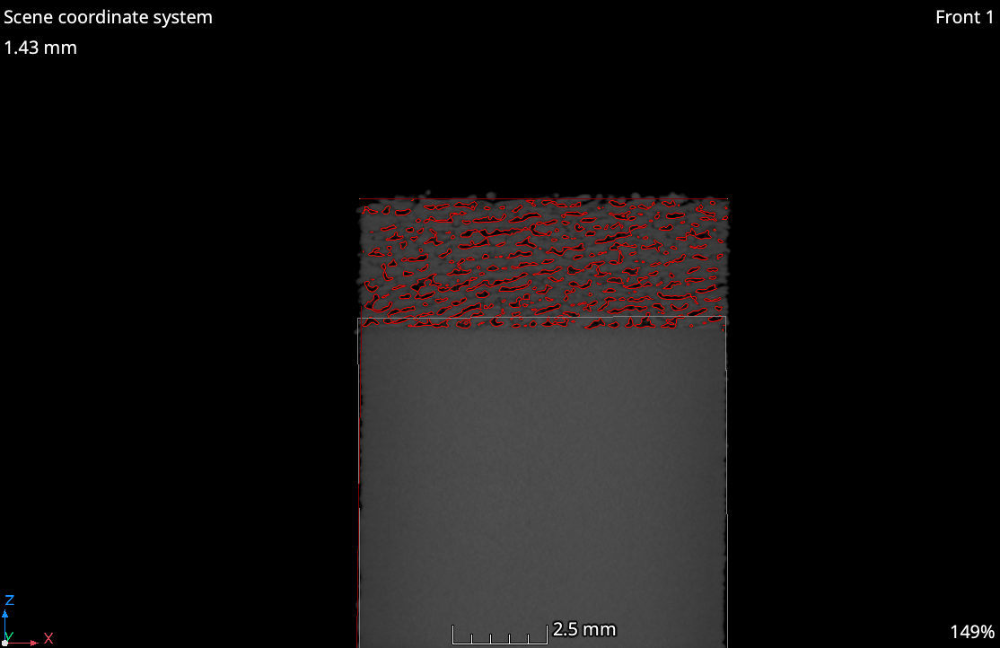

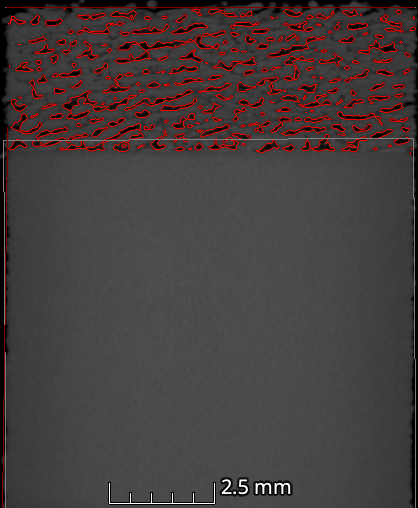

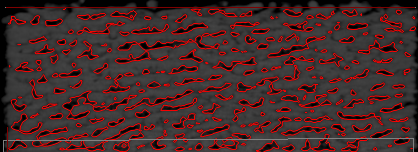

--------------------THE END ----
---------------------------inside Red area --------------------------


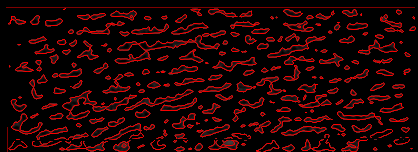

Proportion of the total image area: 
 {0.1896956056408965}


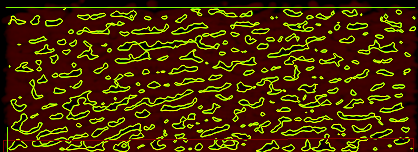

In [ ]:
  print('--------------------This is original image---------------------------\n')
  #cv2_imshow('/content/sample01.tif')
  print('--------------------This is ROI---------------------------\n')
  roi = crop_area_top('/content/FrontXZ.tif')
  upper_img , lower_img = split_image('/content/h2/100.tif' , 0.3)


  cv2_imshow(roi)
  cv2_imshow(upper_img)



  print('--------------------THE END ----')

  print('---------------------------inside Red area --------------------------')

  hsv_img , proportion = calculate_red_area('/content/h2/upper_part.tif')
 
  print('Proportion of the total image area: \n' , {proportion})

  cv2_imshow(hsv_img)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

  cv2.destroyAllWindows()

Read the image from directory

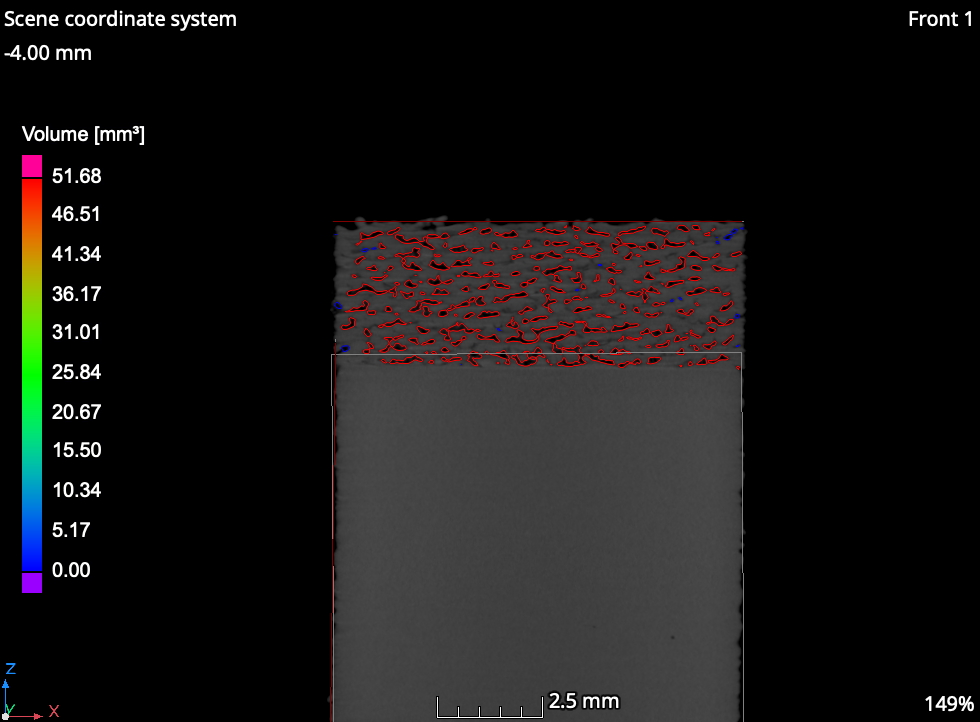

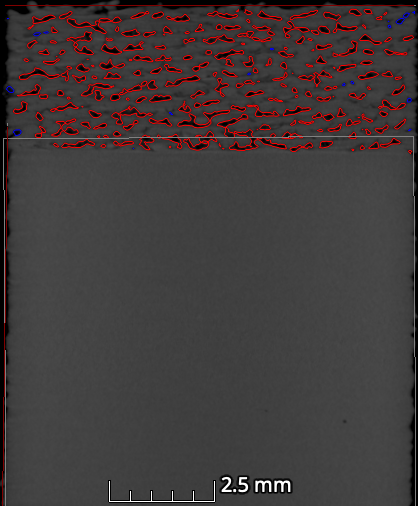

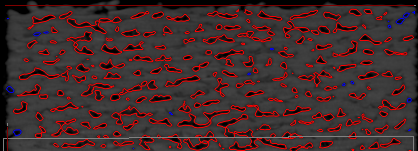

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


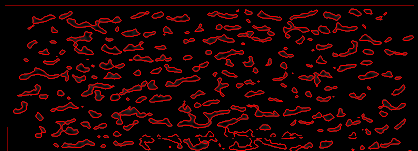

Proportion of the total image area: 
 {0.15867898222377136}


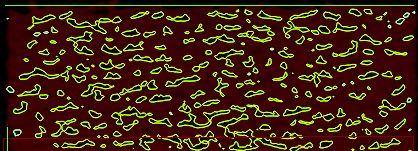

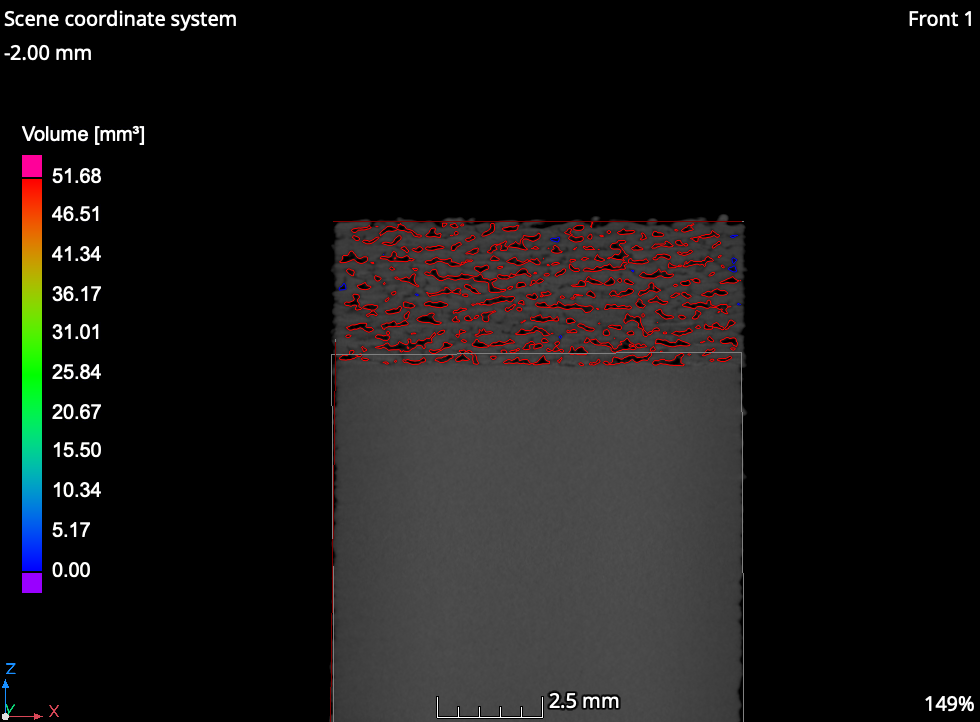

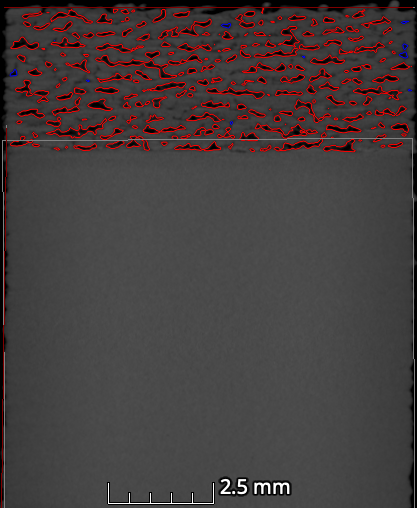

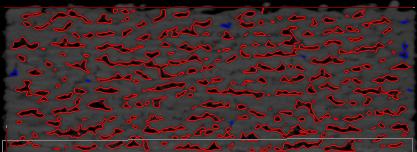

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


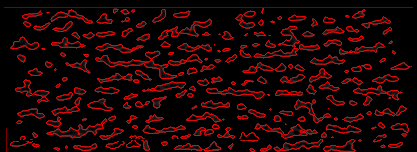

Proportion of the total image area: 
 {0.18811529723589548}


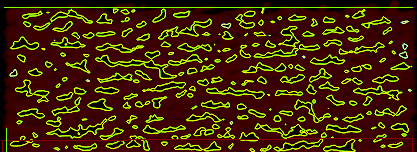

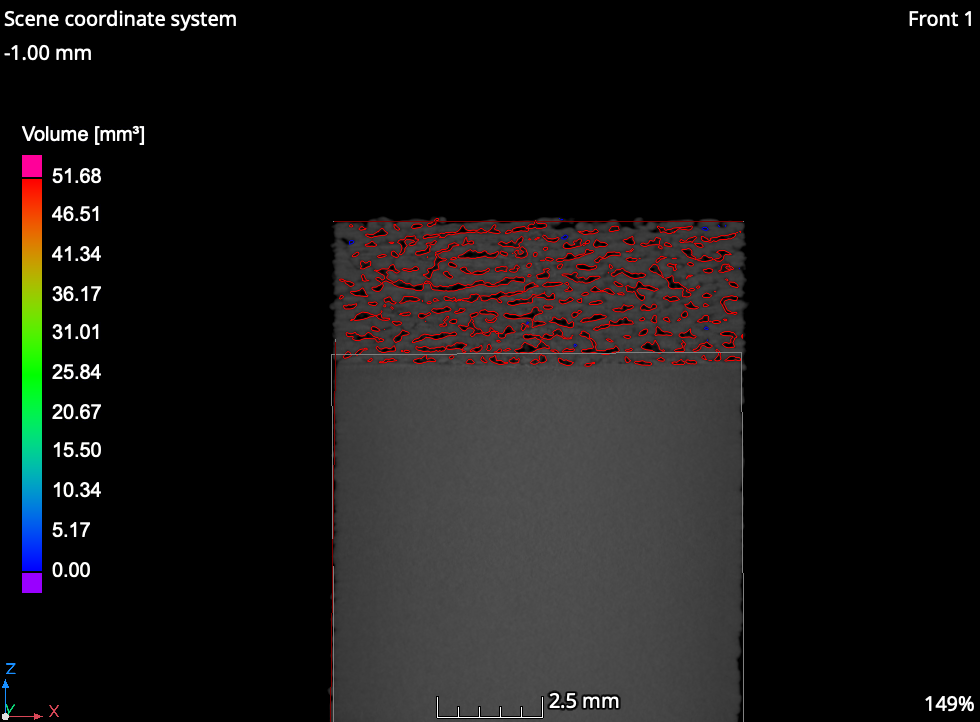

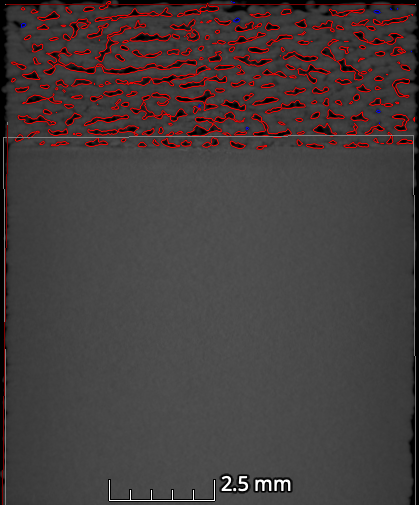

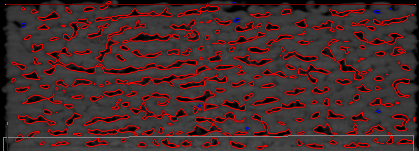

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


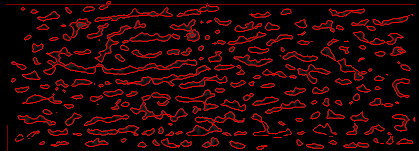

Proportion of the total image area: 
 {0.1979642478939133}


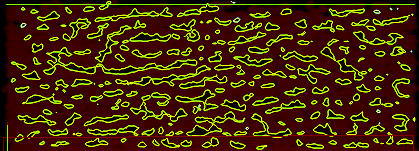

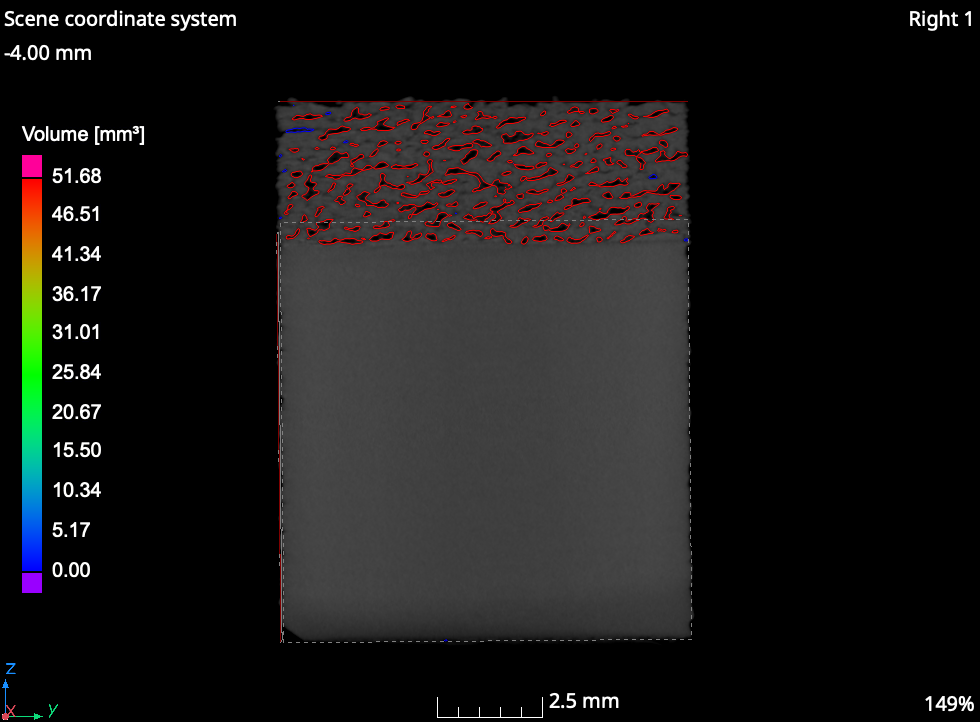

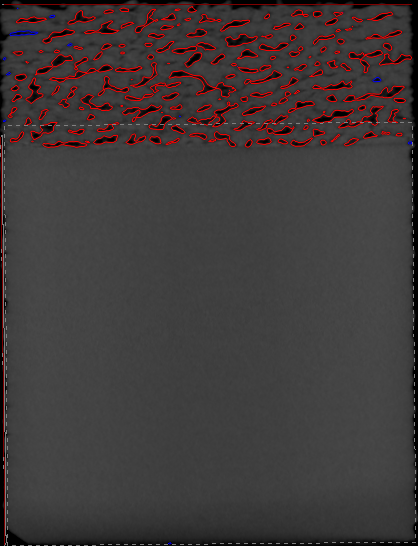

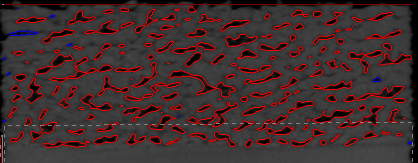

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


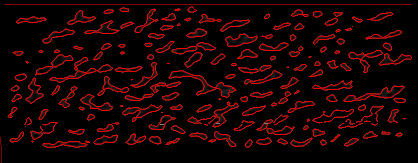

Proportion of the total image area: 
 {0.15265506208354127}


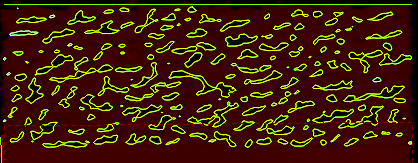

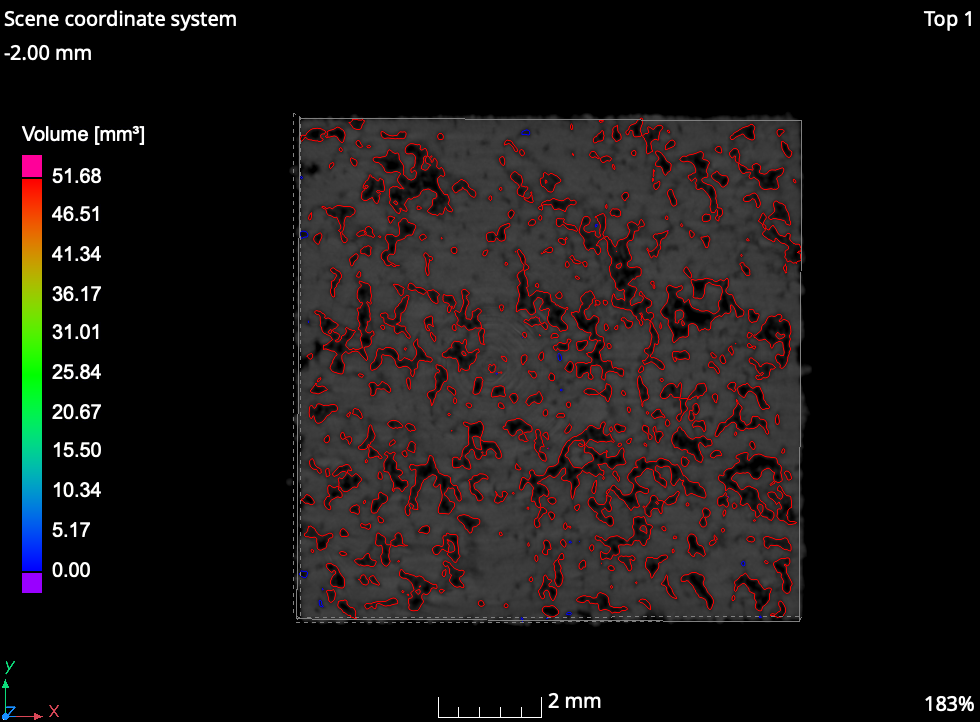

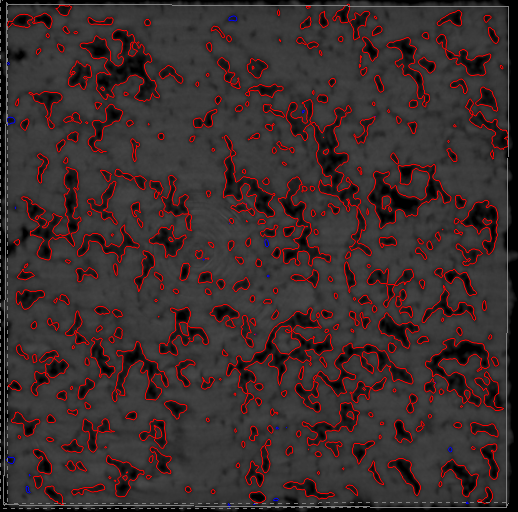

---------------------------Calculate inside the red border --------------------------


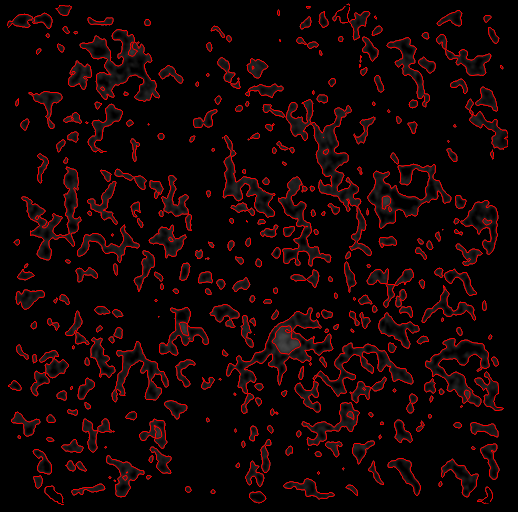

Proportion of the total image area: 
 {0.20154892615830117}


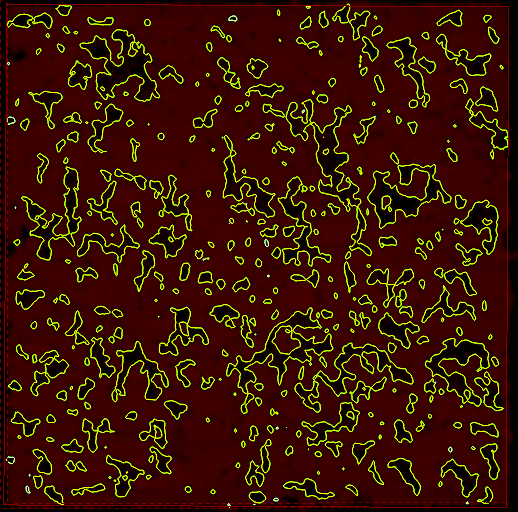

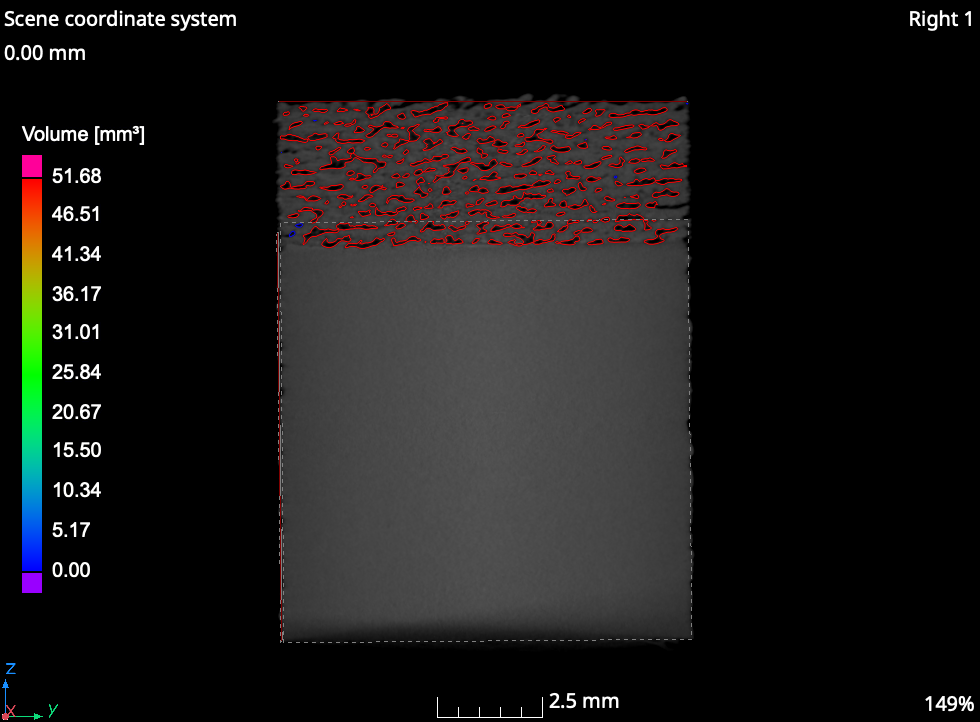

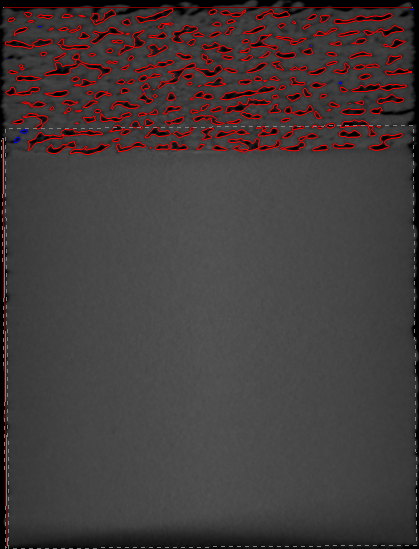

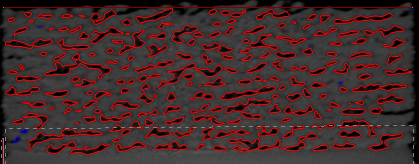

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


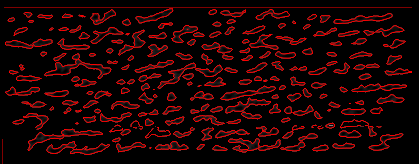

Proportion of the total image area: 
 {0.18786017812445427}


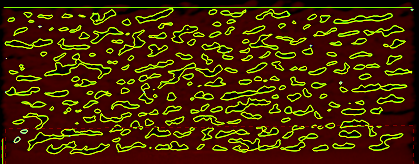

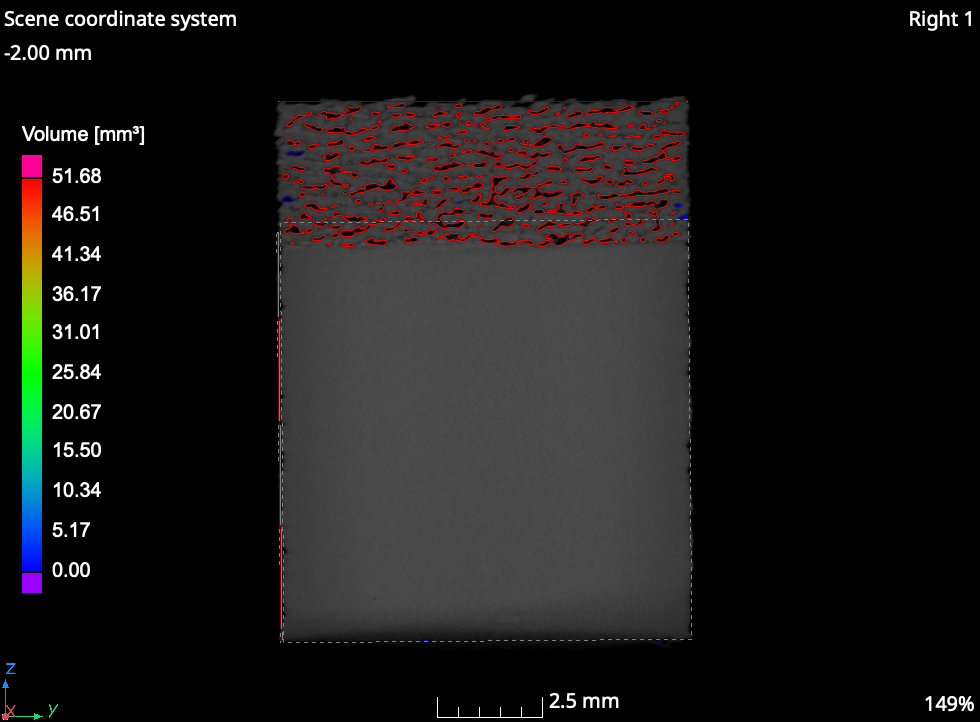

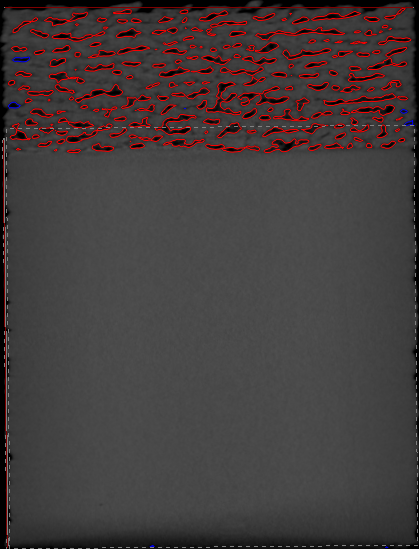

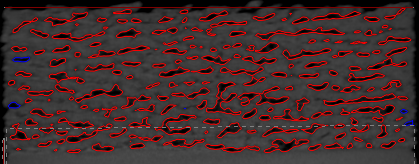

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


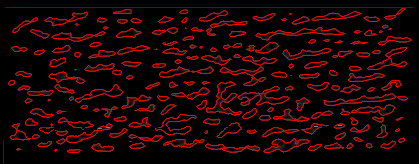

Proportion of the total image area: 
 {0.17542493742359858}


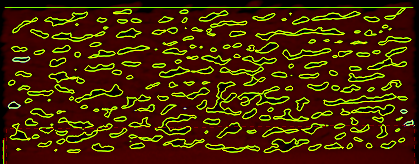

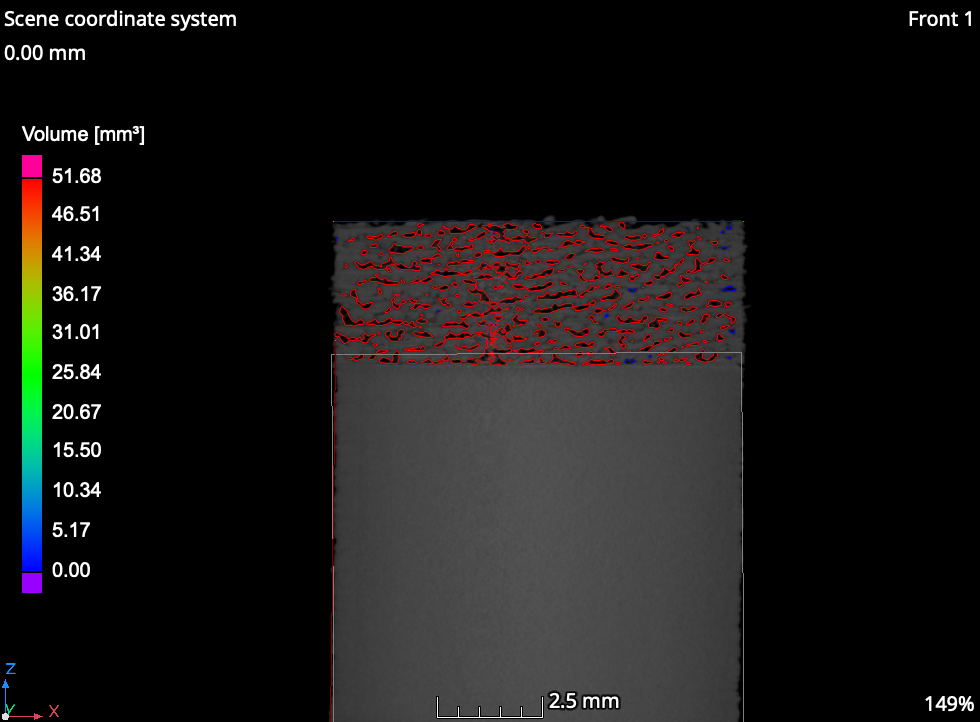

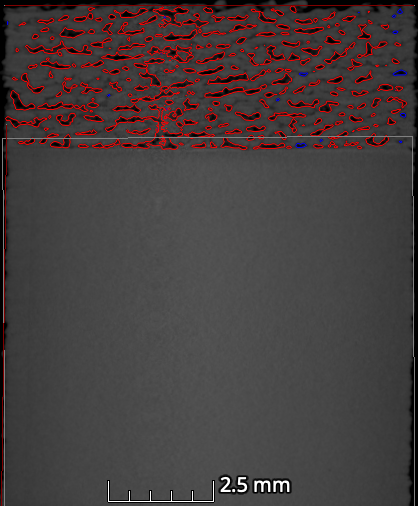

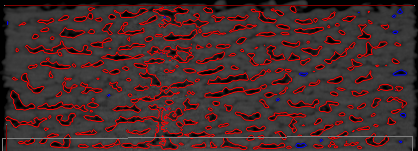

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


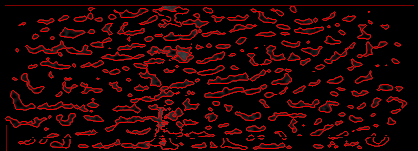

Proportion of the total image area: 
 {0.1885278367502139}


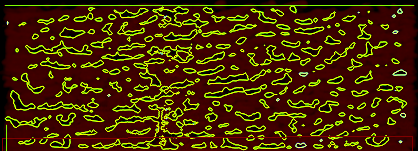

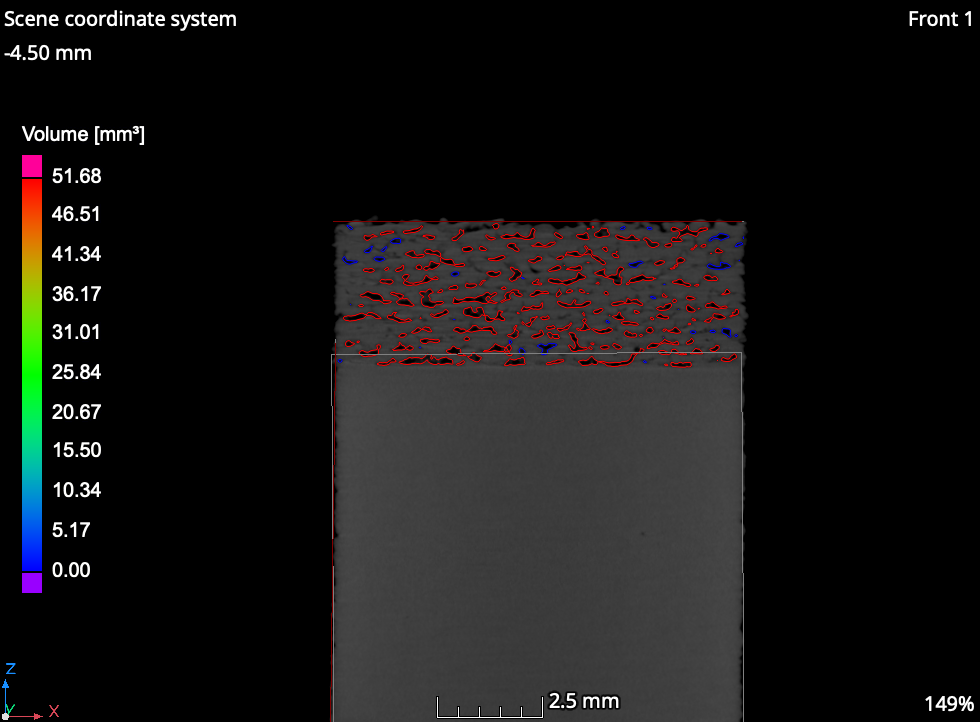

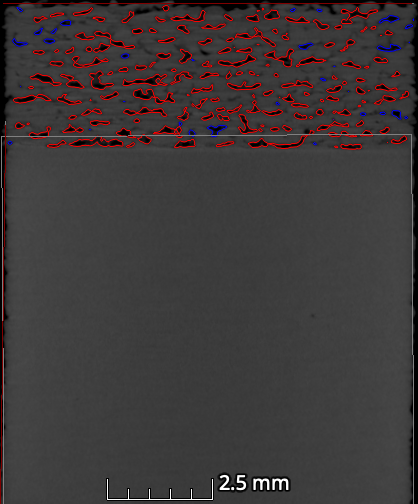

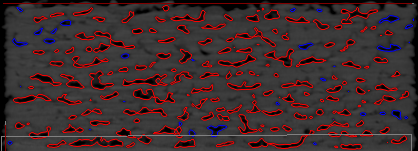

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


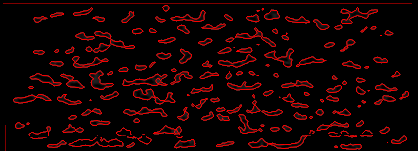

Proportion of the total image area: 
 {0.1329573180392281}


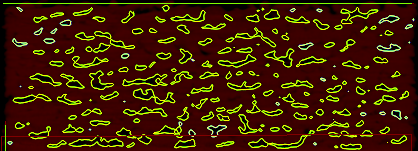

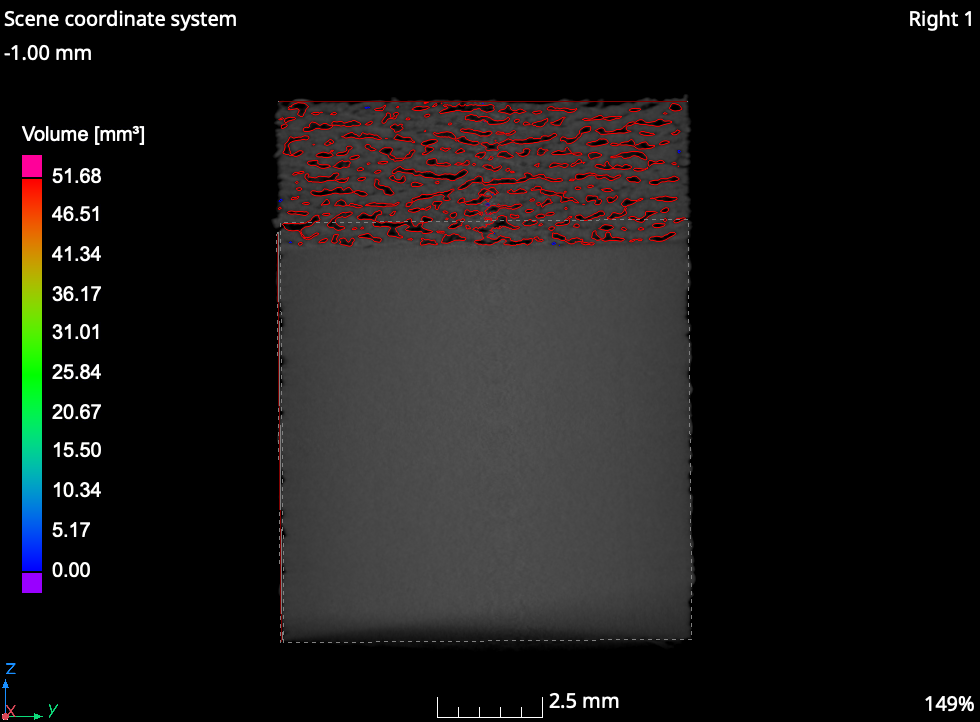

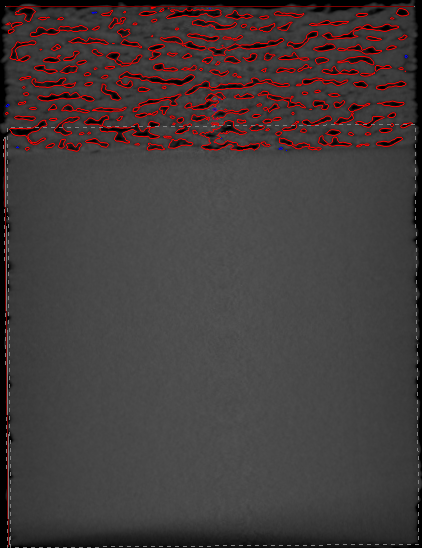

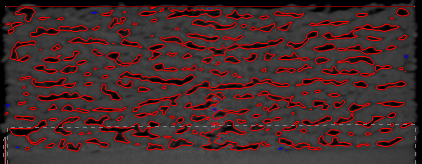

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


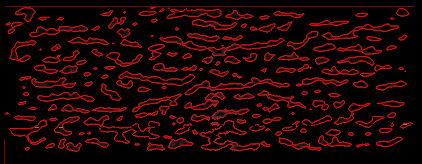

Proportion of the total image area: 
 {0.18446566870881978}


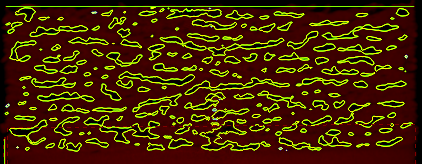

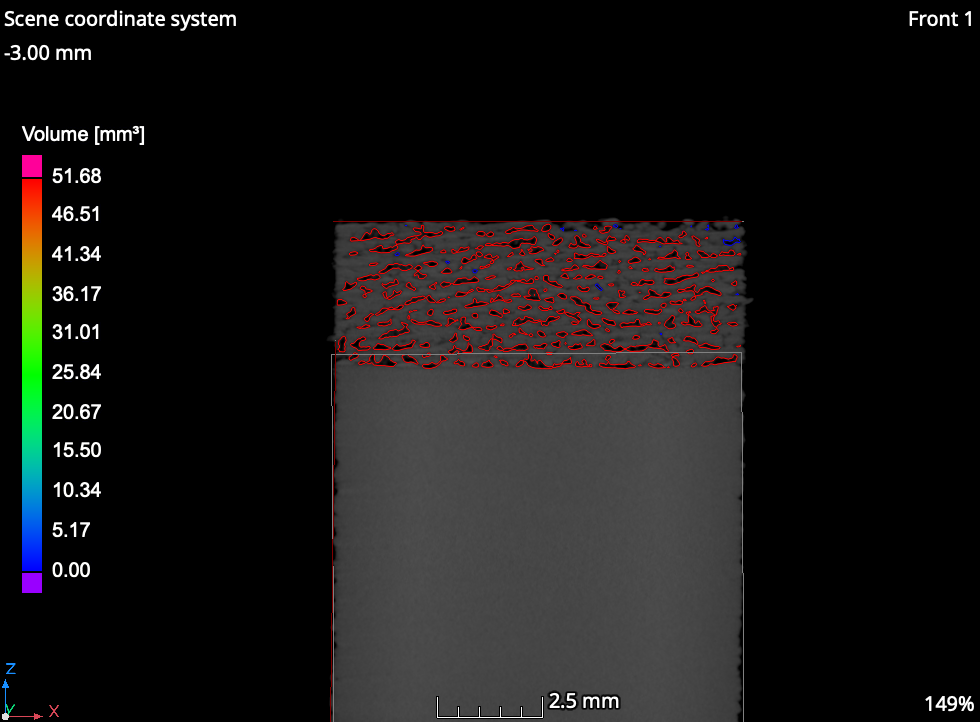

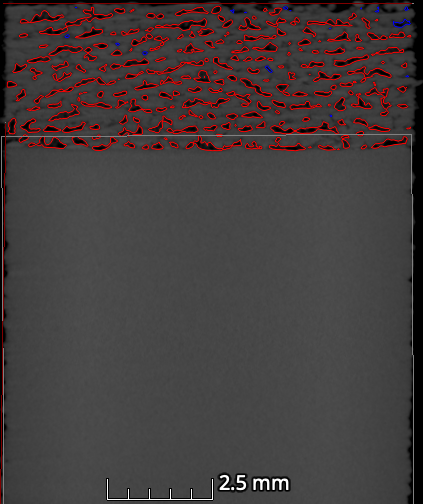

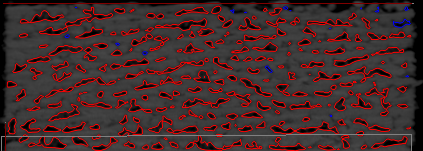

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


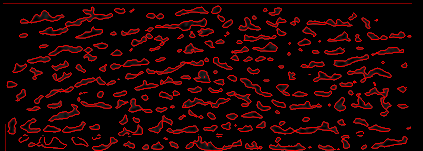

Proportion of the total image area: 
 {0.18606453431027195}


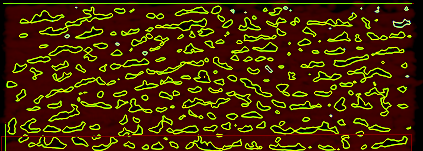

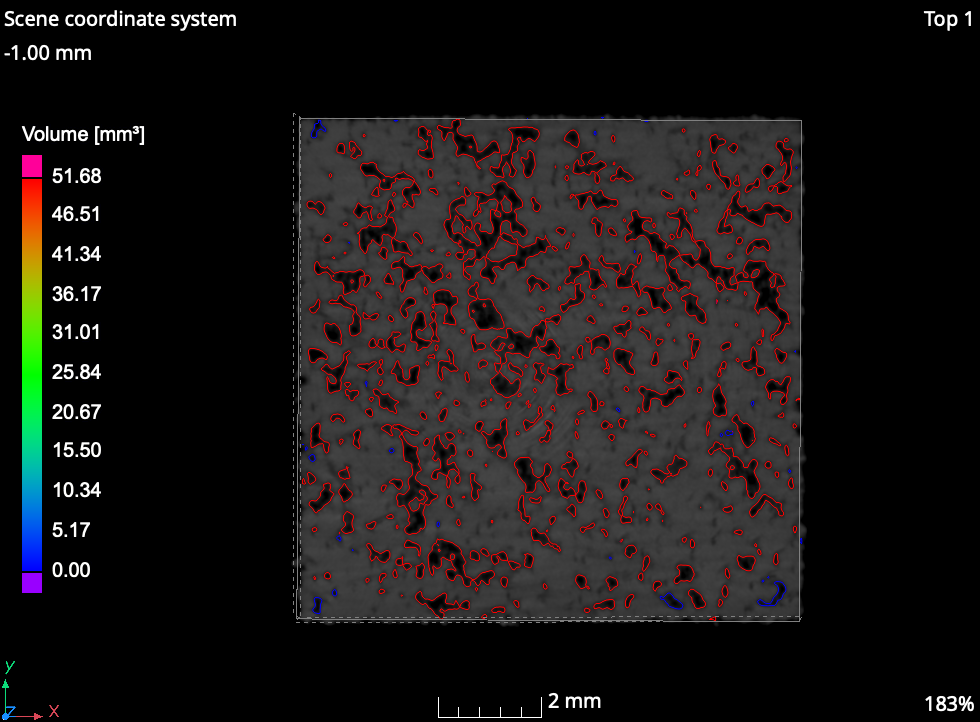

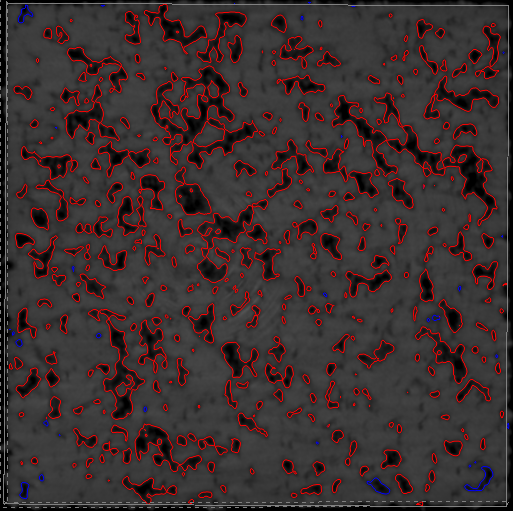

---------------------------Calculate inside the red border --------------------------


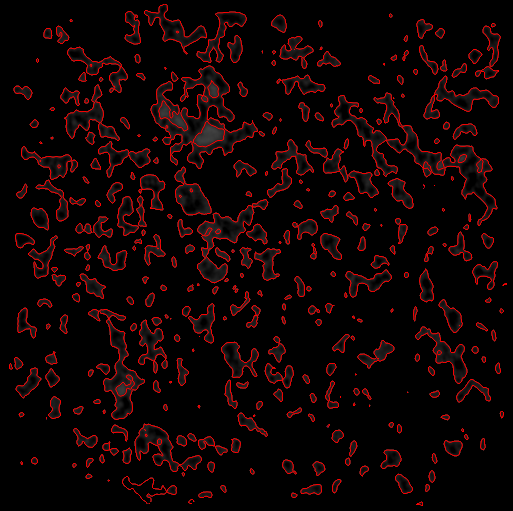

Proportion of the total image area: 
 {0.18532060745470982}


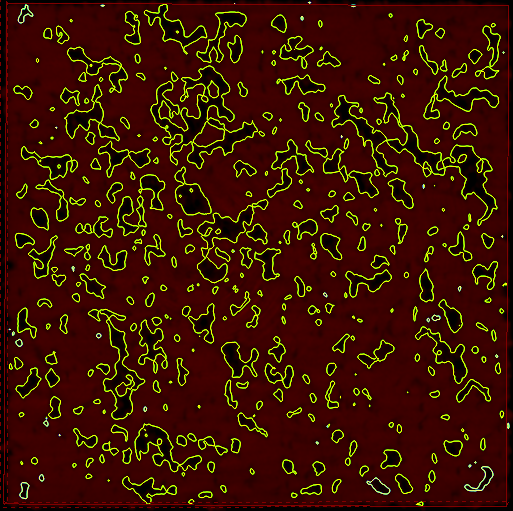

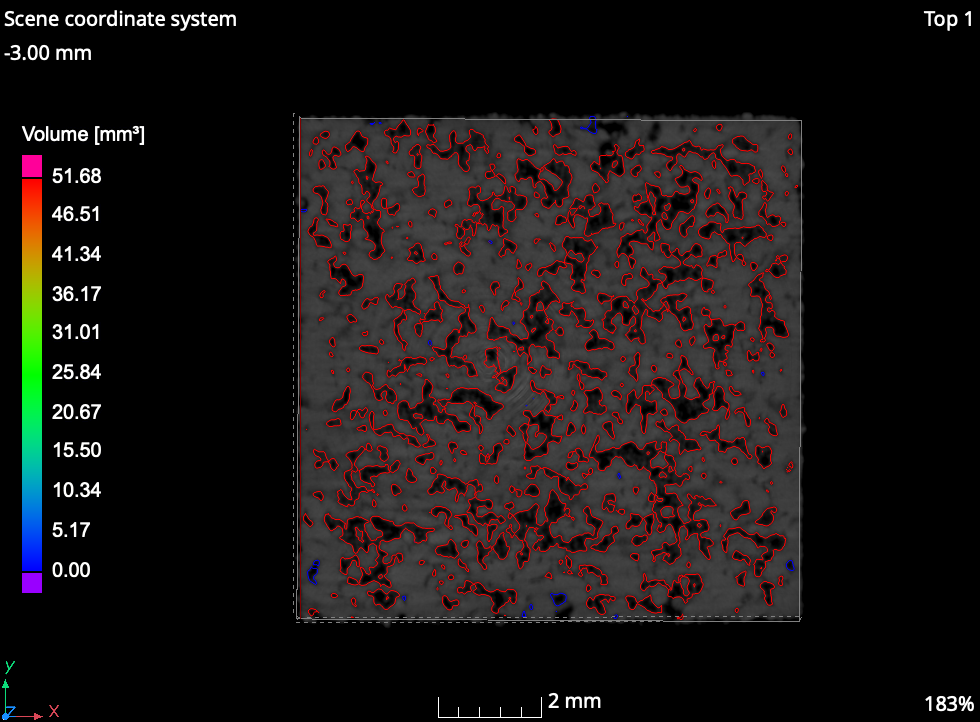

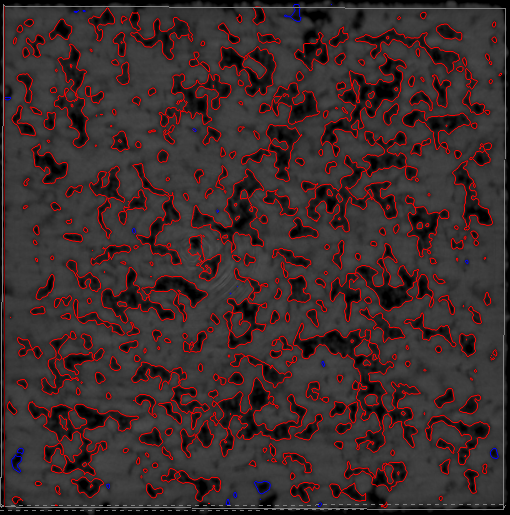

---------------------------Calculate inside the red border --------------------------


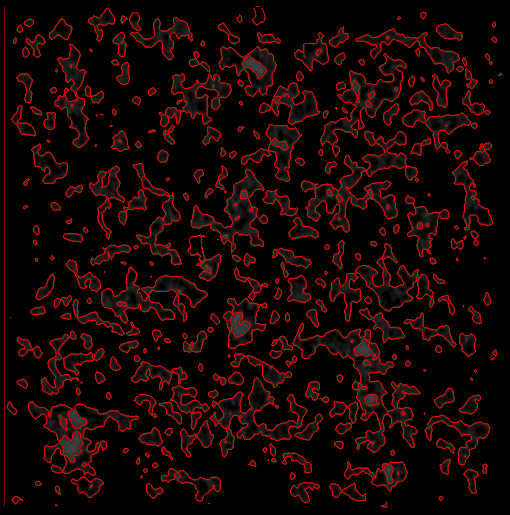

Proportion of the total image area: 
 {0.2557890729107177}


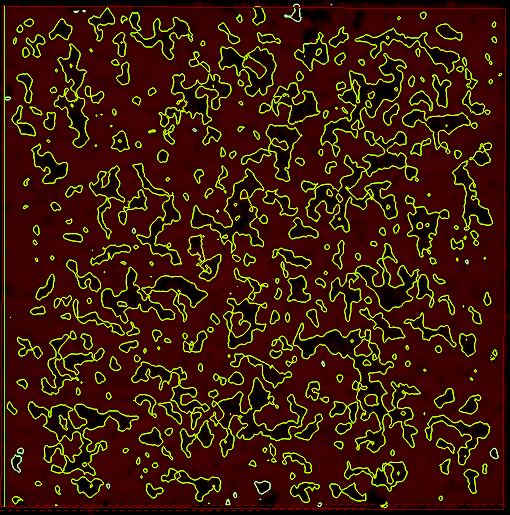

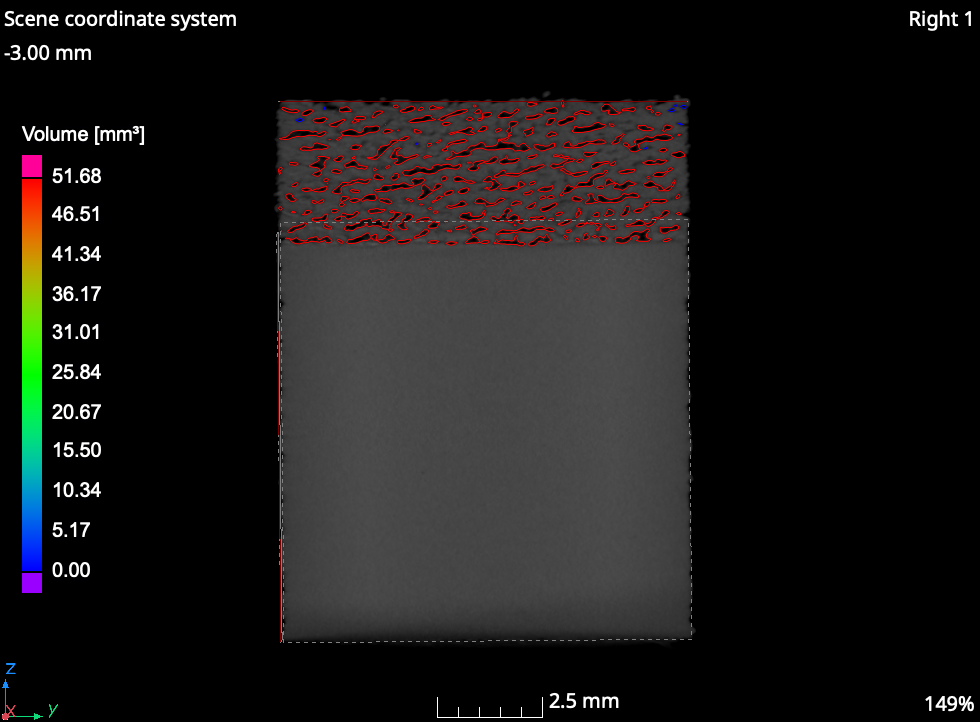

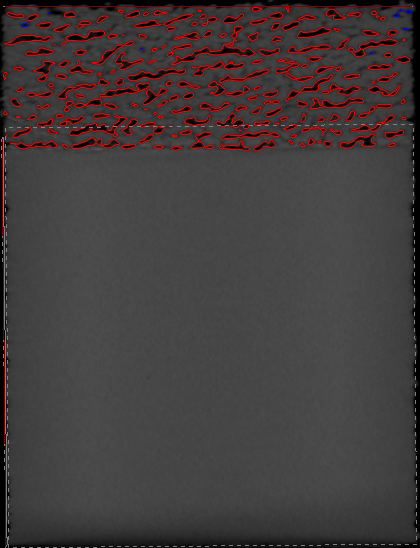

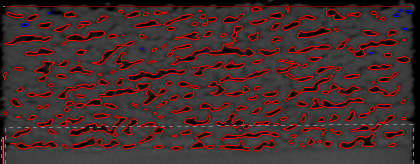

---------------------------Calculate inside the red border --------------------------
---------------------------inside Red area --------------------------


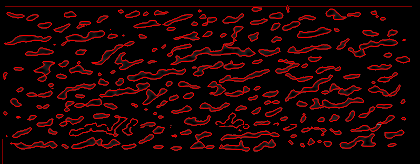

Proportion of the total image area: 
 {0.17631387921022068}


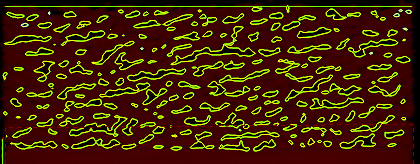

In [ ]:
import os

def read_images_in_directory(directory_path):
    for filename in os.listdir(directory_path):
        if filename.endswith('.tif'):  
            full_path = os.path.join(directory_path, filename)
            if 'XY' in filename:
                full_path = os.path.join('/content/images', filename)
                roi = crop_area_top(full_path)
                
                
                if roi is not None:
                    cv2_imshow(roi)
                else:
                    print(f"Failed to process {full_path}")

                
                print('---------------------------Calculate inside the red border --------------------------')

                hsv_img , proportion = calculate_red_area('/content/h2/100.tif')
                print('Proportion of the total image area: \n' , {proportion})

                if hsv_img is not None:
                    cv2_imshow(hsv_img)
                else:
                    print(f"Failed to process {full_path}")

                cv2.destroyAllWindows()

            elif 'YZ' in filename or 'XZ' in filename:
                full_path = os.path.join('/content/images', filename)
                roi = crop_area_top(full_path)
                upper_img , lower_img = split_image('/content/h2/100.tif' , 0.3) # the ratio for each sample

                if roi is not None:
                    cv2_imshow(roi)
                else:
                    print(f"Failed to process {full_path}")

                if upper_img is not None:
                    cv2_imshow(upper_img)
                else:
                    print(f"Failed to process {full_path}")

                print('---------------------------Calculate inside the red border --------------------------')
                print('---------------------------inside Red area --------------------------')

                hsv_img , proportion = calculate_red_area('/content/h2/upper_part.tif')
                print('Proportion of the total image area: \n' , {proportion})

                if hsv_img is not None:
                    cv2_imshow(hsv_img)
                else:
                    print(f"Failed to process {full_path}")

                cv2.destroyAllWindows()

# Call the function with the path 
read_images_in_directory('/content/images')

In [ ]:
!unzip /content/images.zip

Archive:  /content/images.zip
   creating: images/
  inflating: __MACOSX/._images       
  inflating: images/G2_FB_YZ_n3-00_2-00.tif  
  inflating: __MACOSX/images/._G2_FB_YZ_n3-00_2-00.tif  
  inflating: images/G2_FB_YZ_n2-00_3-00.tif  
  inflating: __MACOSX/images/._G2_FB_YZ_n2-00_3-00.tif  
  inflating: images/.DS_Store        
  inflating: __MACOSX/images/._.DS_Store  
  inflating: images/G2_FB_XY_n1-00_12-00.tif  
  inflating: __MACOSX/images/._G2_FB_XY_n1-00_12-00.tif  
  inflating: images/G2_FB_XZ_n4-00_1-00.tif  
  inflating: __MACOSX/images/._G2_FB_XZ_n4-00_1-00.tif  
  inflating: images/G2_FB_XY_n2-00_1-00.tif  
  inflating: __MACOSX/images/._G2_FB_XY_n2-00_1-00.tif  
  inflating: images/G2_FB_XZ_n2-00_3-00.tif  
  inflating: __MACOSX/images/._G2_FB_XZ_n2-00_3-00.tif  
  inflating: images/G2_FB_YZ_n4-00_1-00.tif  
  inflating: __MACOSX/images/._G2_FB_YZ_n4-00_1-00.tif  
  inflating: images/G2_FB_XZ_n3-00_2-00.tif  
  inflating: __MACOSX/images/._G2_FB_XZ_n3-00_2-00.tif  
  in

Calculalate some Quantities 

In [17]:
import cv2
import numpy as np
from shapely.geometry import Polygon
import random

def random_countor_area_sm_sp(image_path, pixel_size):
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image at {image_path}")
        return

    # Convert the image to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define range for red color in HSV
    lower_red = np.array([0, 50, 50])
    upper_red = np.array([10, 255, 255])

    # Threshold the HSV image to get only red color
    mask = cv2.inRange(hsv, lower_red, upper_red)

    # Find contours in the binary image
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Select a random contour
    selected_contour = random.choice(contours)

    # Create a blank image of same size as the original image
    blank_image = np.zeros(image.shape, dtype=np.uint8)

    # Draw the selected contour on the blank image
    cv2.drawContours(blank_image, [selected_contour], -1, (0, 255, 0), 2)

    # Create a Shapely Polygon object from the contour
    polygon = Polygon([point[0] for point in selected_contour])

    # Calculate the area of the polygon in square pixels
    area_pixels = polygon.area
    print("Area in square pixels:", area_pixels)

    # Calculate and print the area of the polygon in square microns
    area_microns = area_pixels * (pixel_size ** 2)
    print("Area in square microns:", area_microns)

    # Show the image with the selected contour
    cv2_imshow(blank_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Call the function
random_countor_area_sm_sp('/content/sample02.tif', calculate_pixels_in_scale_bar('/content/sample02.tif')/2)

NameError: ignored

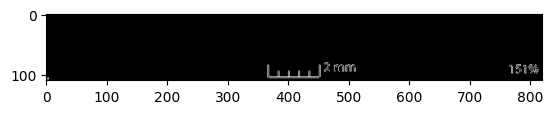

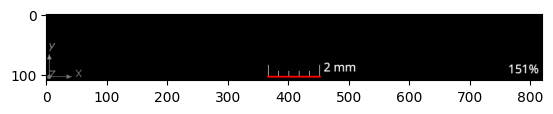

Length of scale bar: 87 pixels


In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_pixels_in_scale_bar(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    height, width = image.shape
    roi = image[int(height*0.85):, :]
    _, thresh = cv2.threshold(roi, 200, 255, cv2.THRESH_BINARY)
    edges = cv2.Canny(thresh, 30, 100, apertureSize=3)
    plt.imshow(edges, cmap='gray')
    plt.show()
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, 50, minLineLength=50, maxLineGap=5)
    if lines is None:
        print('No lines found')
    else:
        longest_line = max(lines, key=lambda line: line[0][2] - line[0][0])
        x1, y1, x2, y2 = longest_line[0]
        roi_vis = cv2.cvtColor(roi, cv2.COLOR_GRAY2RGB)
        cv2.line(roi_vis, (x1, y1), (x2, y2), (255, 0, 0), 2)
        plt.imshow(roi_vis)
        plt.show()
        length = x2 - x1
        print(f'Length of scale bar: {length} pixels')
        return length


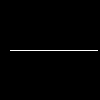

In [16]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Create an image
image = np.zeros((100, 100), dtype=np.uint8)  # replace with your image or create a blank image of desired size

# Draw a horizontal line with 87 pixels
line_length = 87
start_point = (10, 50)  # starting point (x, y) coordinates
end_point = (10 + line_length, 50)  # ending point (x, y) coordinates
color = 255  # white color
thickness = 1  # line thickness

# Draw the line on the image
cv2.line(image, start_point, end_point, color, thickness)

# Display the image
cv2_imshow( image)
cv2.waitKey(0)
cv2.destroyAllWindows()